In [4]:
# import statements
from plantcv import plantcv as pcv
import numpy as np
import os
import matplotlib #. used for backend plotting
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.figure
import argparse
import csv
%matplotlib inline
#turns on an interactive mode with the images
#%matplotlib inline
#turns off the interactive mode with images

In [5]:
# for viewing images during trianing, ## delete
matplotlib.rcParams["figure.figsize"] = [8,8] 

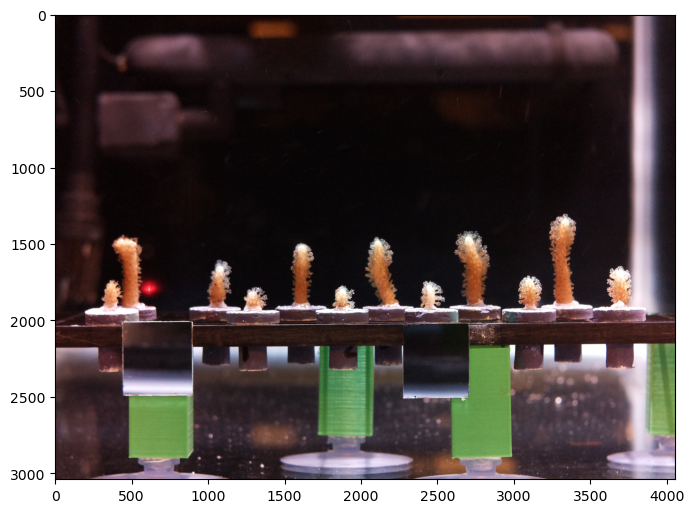

2022-06-15_140001.jpg


In [64]:
class options:
    def __init__(self):       
        self.image = "/Users/usr12/Documents/mori/mori/project_roccs/indir/2022-06-15_140001.jpg" # path to file
        self.debug = "plot" #print to write to a file, plot to see it, none to do nothing
        self.writeimg = False
        self.result = "/Users/Usr12/Desktop/mori/mori/project_roccs/result/out_data.json" # results output, this is not necessary if you pycsv manual configuration
        self.outdir = "/Users/Usr12/Desktop/mori/mori/project_roccs/outdir/"
        
args = options()
pcv.params.debug_outdir = args.outdir
pcv.params.debug = args.debug
print(args)

# Increase text size in plots
pcv.params.text_size = 50
# Increase line thickness in plots
pcv.params.text_thickness = 15

#reads in rgb image with var filename
img, path, filename = pcv.readimage(filename=args.image)

print(filename)
#%matplotlib inline
#inline makes images non-interactive

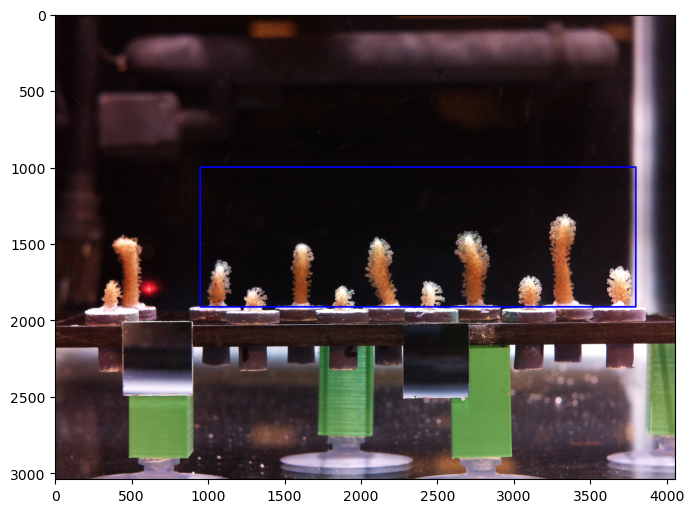

In [65]:

img=pcv.crop(img=img, x=950, y=1000, h=915, w=2850)

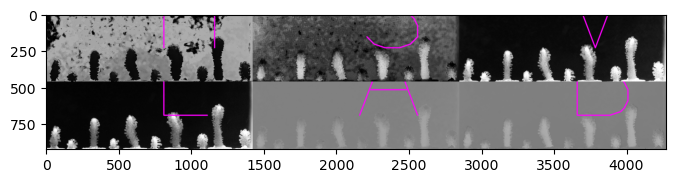

In [26]:
# See which colorspace is best, ## delete
# There are plenty of ways seperate a plantcv from the background
# see more tools in pcv sub package 'visualize'

colorspace = pcv.visualize.colorspaces(rgb_img=img, original_img=False)

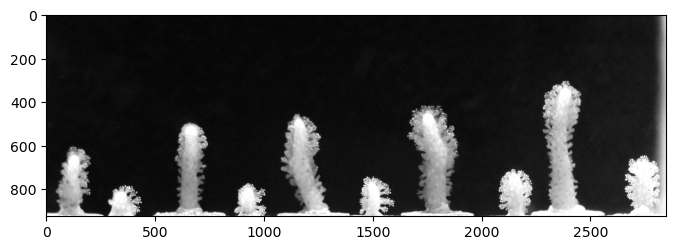

In [27]:
v = pcv.rgb2gray_hsv(rgb_img=img, channel='v')
#select the channel you think will be the most appropriate to work with, this example shows channel v

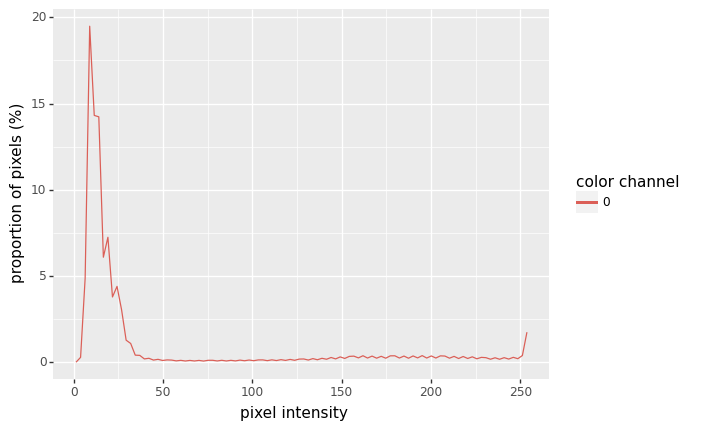

In [28]:
hist = pcv.visualize.histogram(img=v)
#this is supposedly a more straight forward method to threshold the images ## delete
# histogram shows dark pixel intensity to easier find the best threshold value

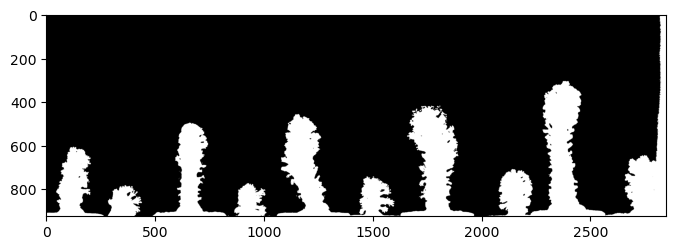

In [29]:
# Threshold img
v_thresh = pcv.threshold.binary(gray_img=v, threshold=90, max_value=255, object_type='light')
#objects we are intersted in are dark, therefore it is denoted as dark and not light



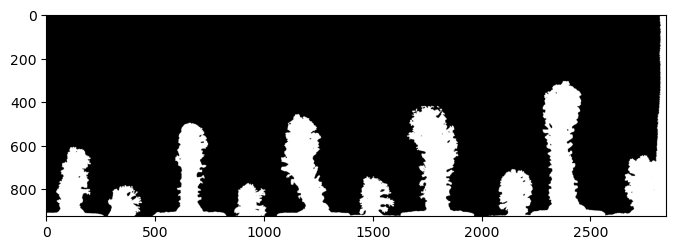

In [30]:
# Clear grain
v_fill_image1 = pcv.fill(bin_img=v_thresh, size=50)
# this line says that any object in the located in the image that are less than 500 pixels, fill it with background
#this is to get rid of the "salt and pepper" of the image
#similar to thresholding pixel val but instead we are threshing object size

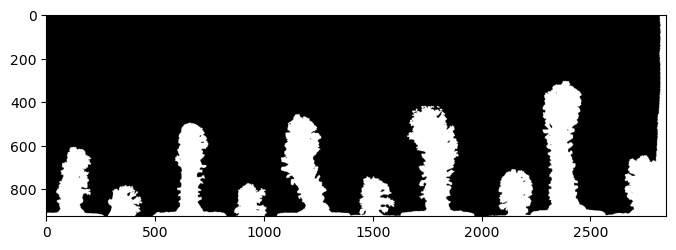

In [31]:
v_dilated = pcv.dilate(gray_img=v_fill_image1, ksize=2, i=1)
# Dilate
# changes the object thickness, change variables ksize and i


In [32]:
#vb = pcv.logical_or(bin_img1=v_thresh, bin_img2=b_thresh)
# this is a way to combine color channels, not necessary at the current moment since we are only using one channel

In [33]:
#vbs = pcv.logical_or(bin_img1=vb, bin_img2=a_thresh)
#adding another color channel to the mix, again it is uncessesary at the moment

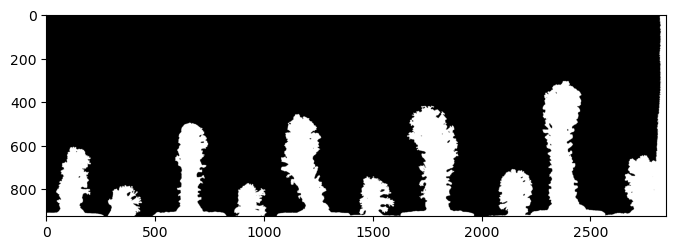

In [34]:
v_fill_image2 = pcv.fill(bin_img=v_thresh, size=500)

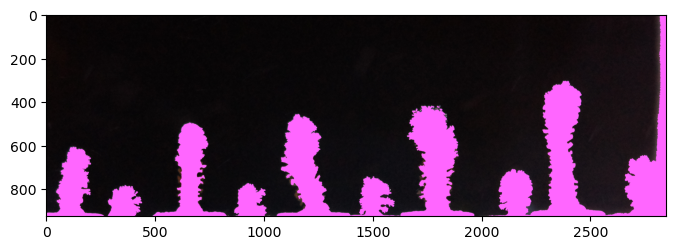

In [35]:
obj, obj_hierarchy = pcv.find_objects(img=img, mask=v_dilated)
#this has the computer show the objects that it has identified in pink of all colors, its blue really. 

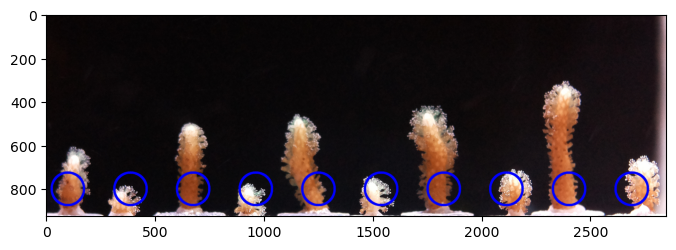

In [58]:
pcv.params.line_thickness = 10
rois1, roi_hierarchy1 = pcv.roi.multi(img=img, coord=(100,800), 
                                      radius=75, spacing=(288, 100), nrows=1, ncols=10)
#roi = region on interest

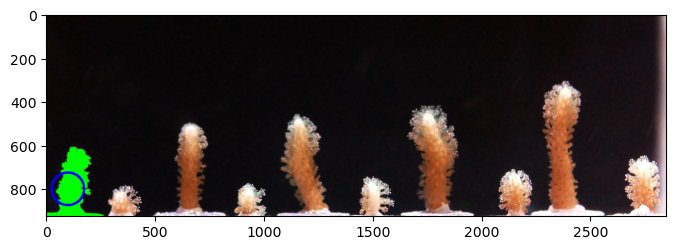

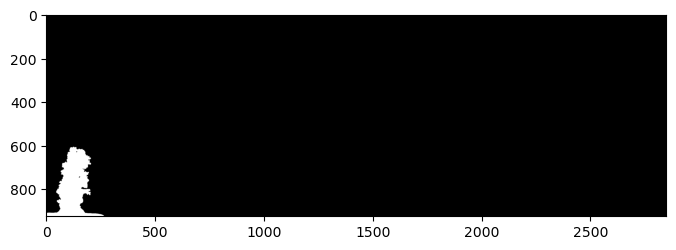

Object 0 Area: 36626 pixels


In [59]:
roi = rois1[0]
hierarchy = roi_hierarchy1[0]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area0 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 0 Area:",filtered_area0, "pixels")

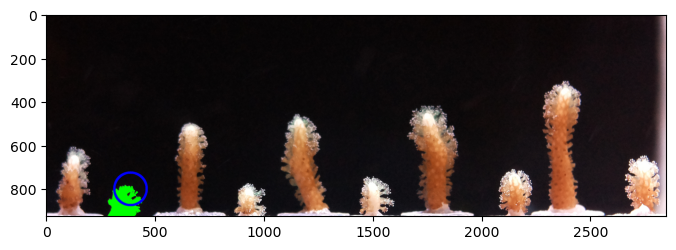

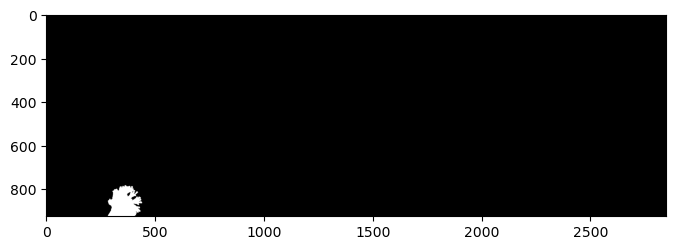

Object 1 Area: 15772 pixels


In [60]:
roi = rois1[1]
hierarchy = roi_hierarchy1[1]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area1 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 1 Area:",filtered_area1, "pixels")

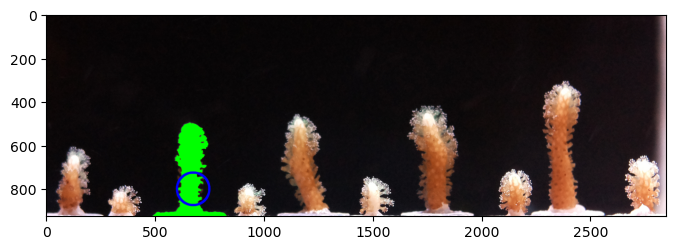

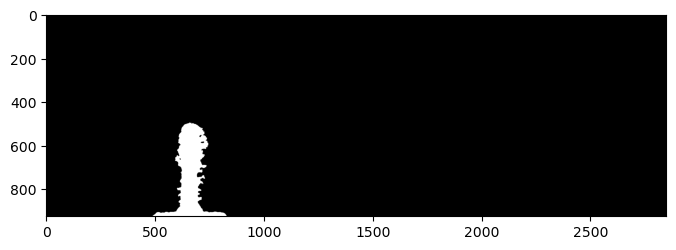

Object 2 Area: 47450 pixels


In [61]:
roi = rois1[2]
hierarchy = roi_hierarchy1[2]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area2 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 2 Area:",filtered_area2, "pixels")

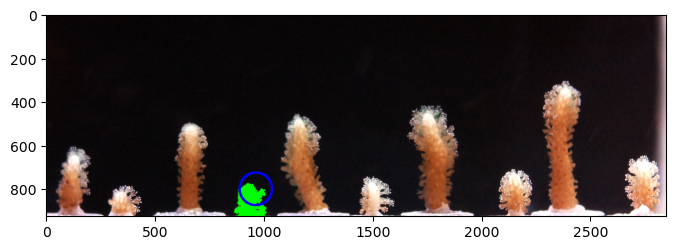

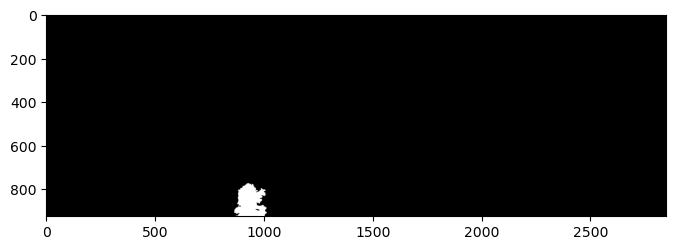

Object 3 Area: 15724 pixels


In [62]:
roi = rois1[3]
hierarchy = roi_hierarchy1[3]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area3 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 3 Area:",filtered_area3, "pixels")

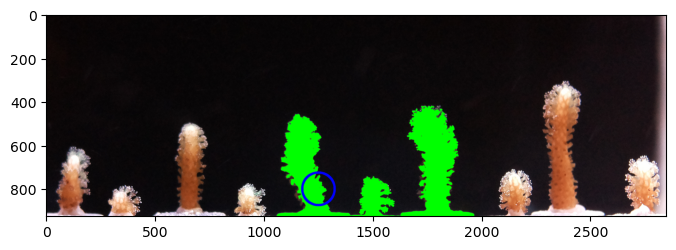

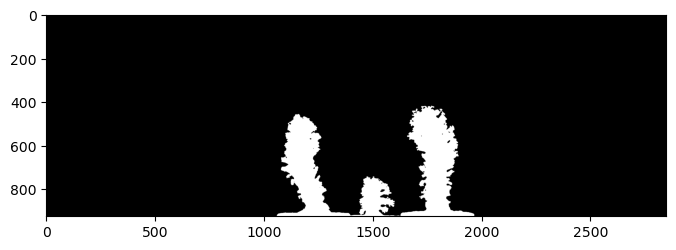

Object 4 Area: 158049 pixels


In [63]:
roi = rois1[4]
hierarchy = roi_hierarchy1[4]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area4 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 4 Area:",filtered_area4, "pixels")

<IPython.core.display.Javascript object>


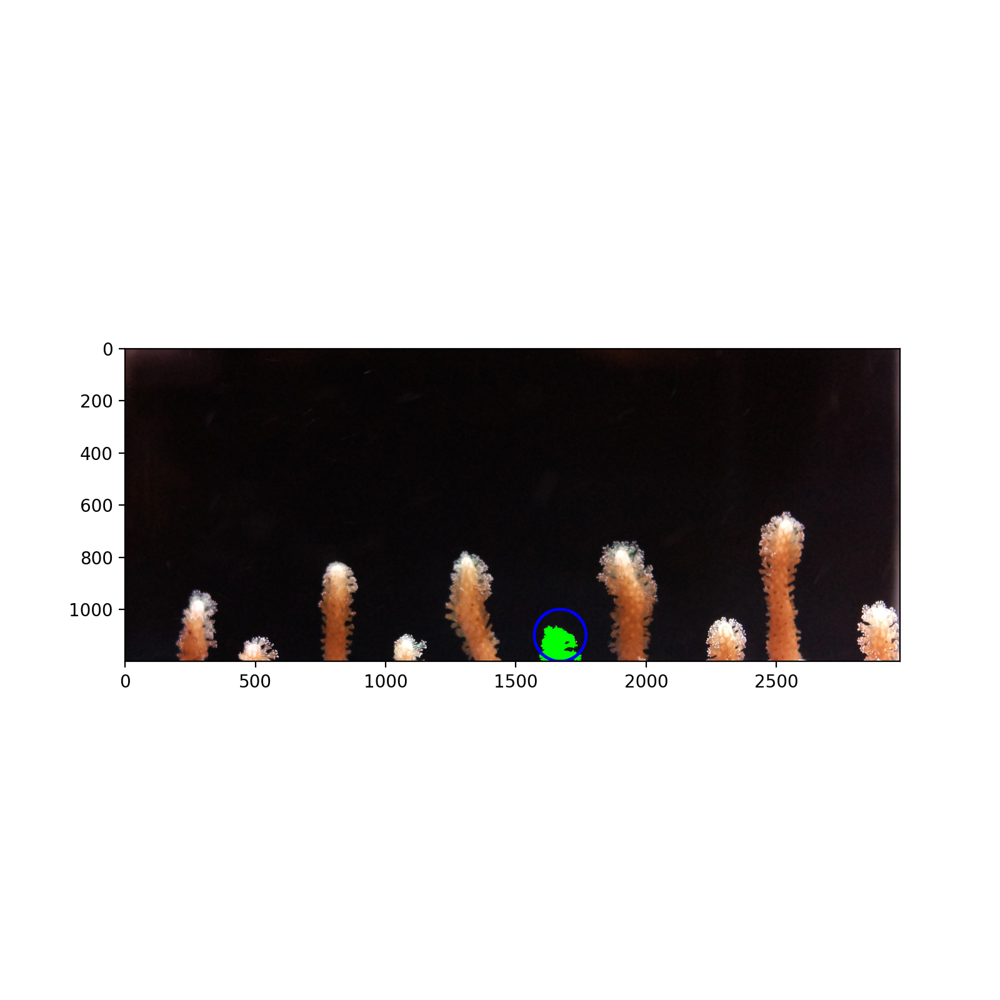

<IPython.core.display.Javascript object>


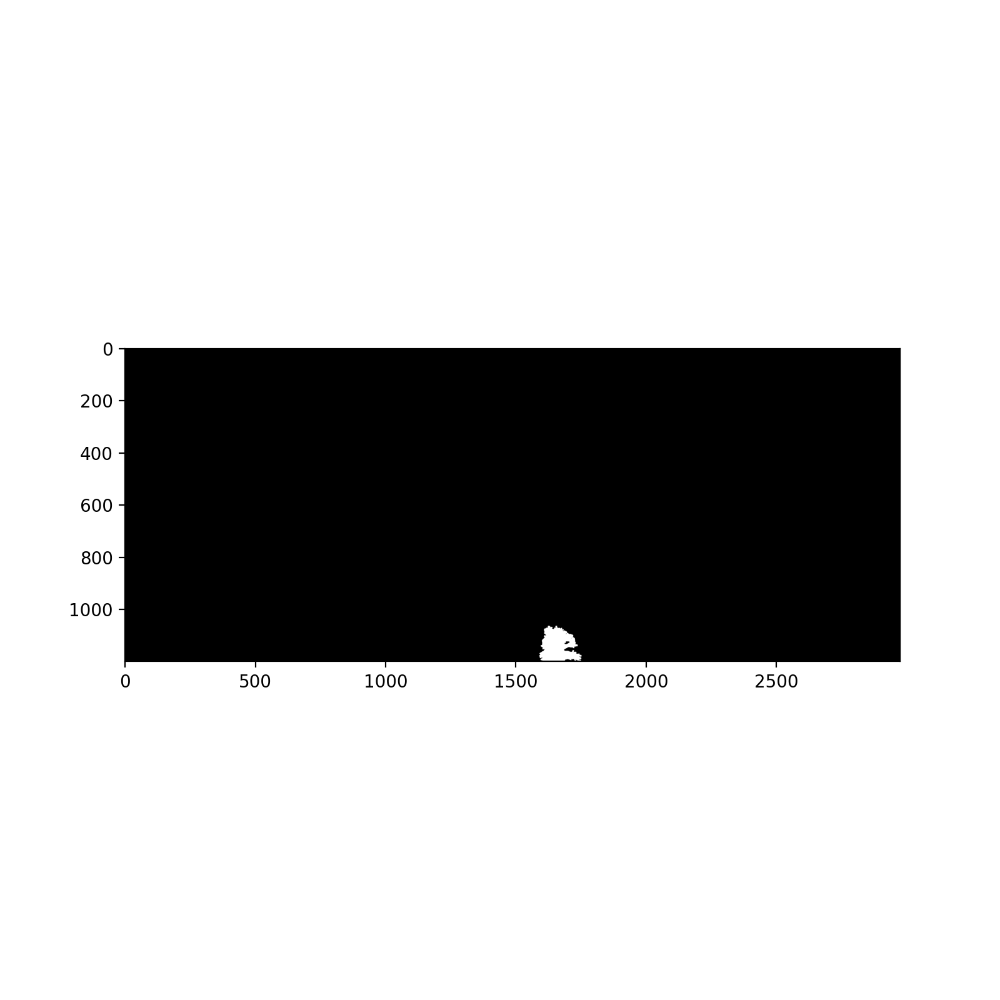

Object 5 Area: 14964 pixels


In [43]:
roi = rois1[5]
hierarchy = roi_hierarchy1[5]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area5 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 5 Area:",filtered_area5, "pixels")

<IPython.core.display.Javascript object>


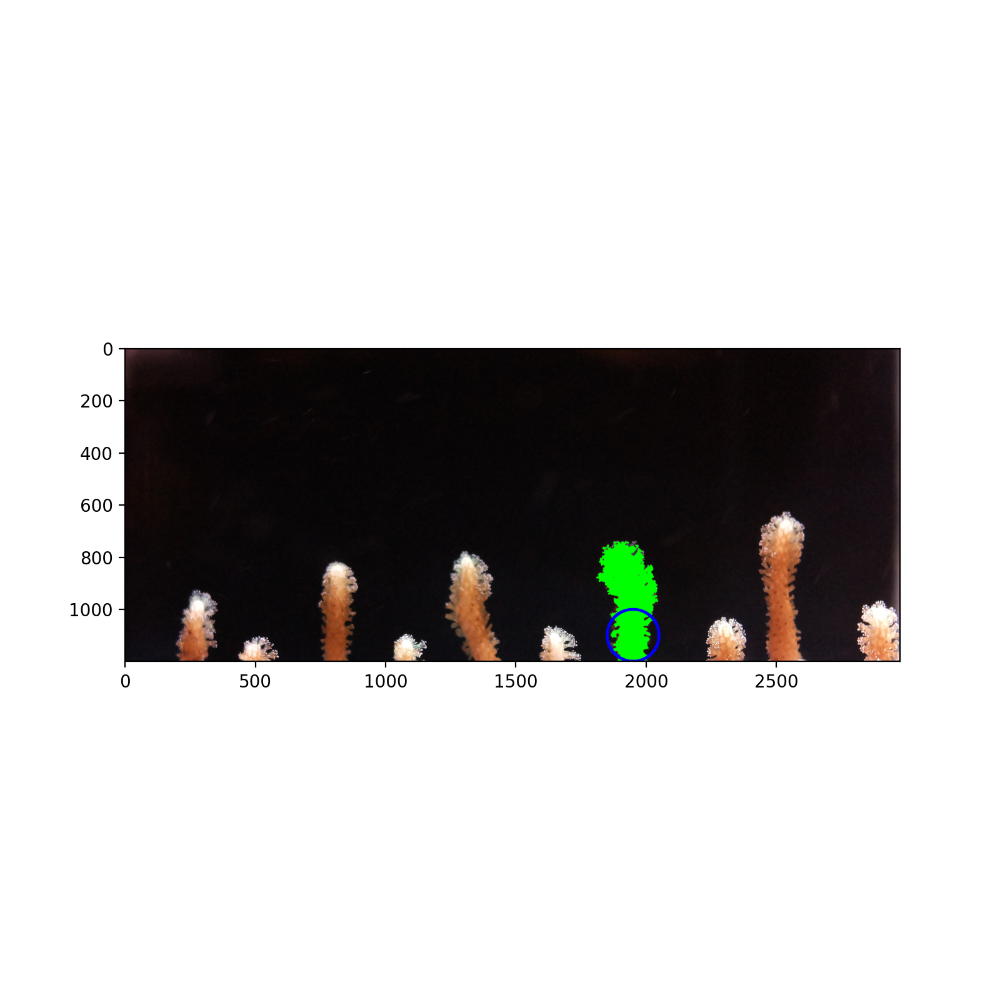

<IPython.core.display.Javascript object>


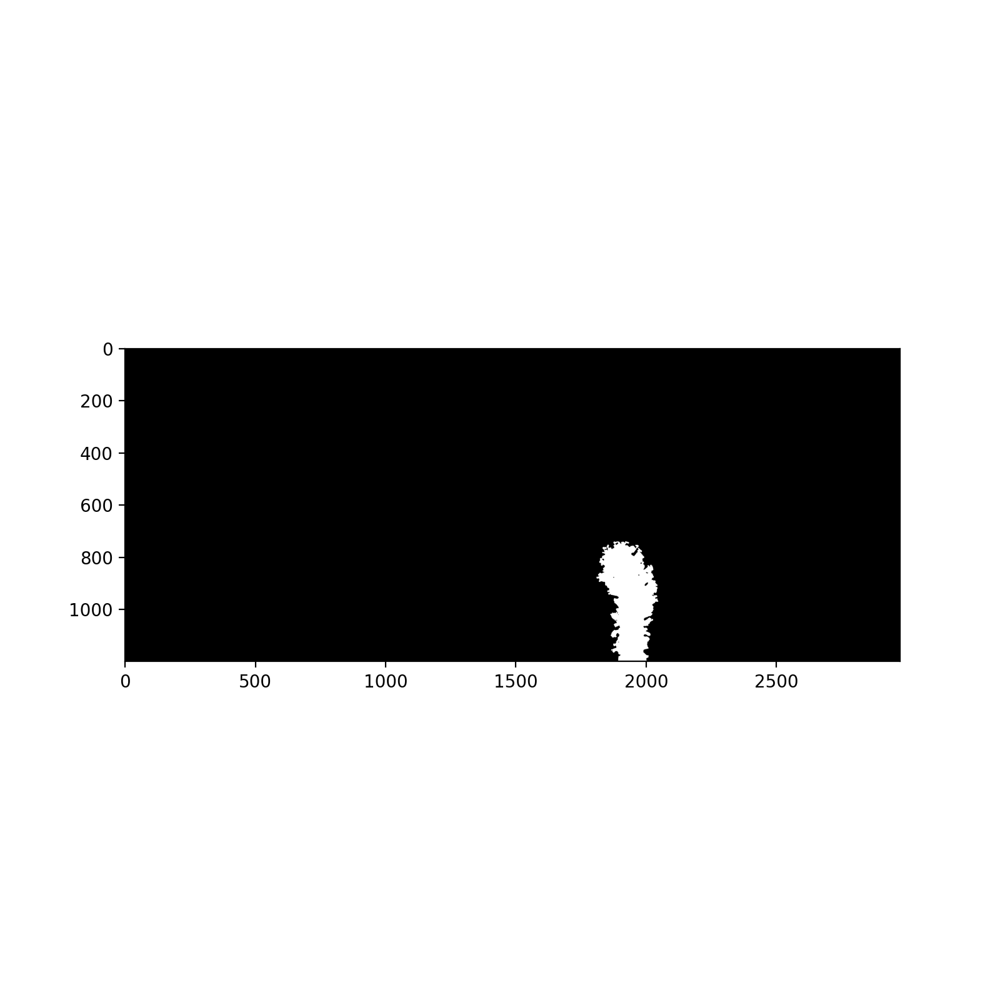

Object 6 Area: 66278 pixels


In [44]:
roi = rois1[6]
hierarchy = roi_hierarchy1[6]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area6 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 6 Area:",filtered_area6, "pixels")

<IPython.core.display.Javascript object>


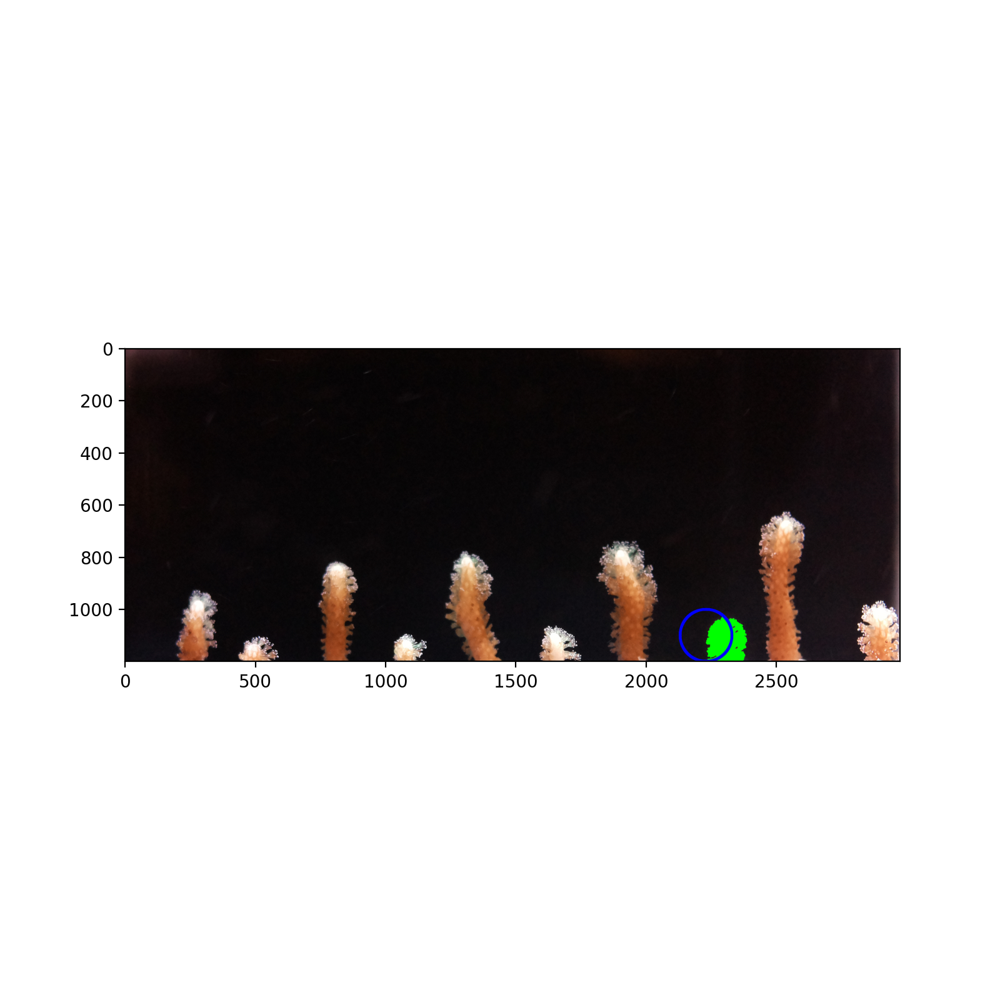

<IPython.core.display.Javascript object>


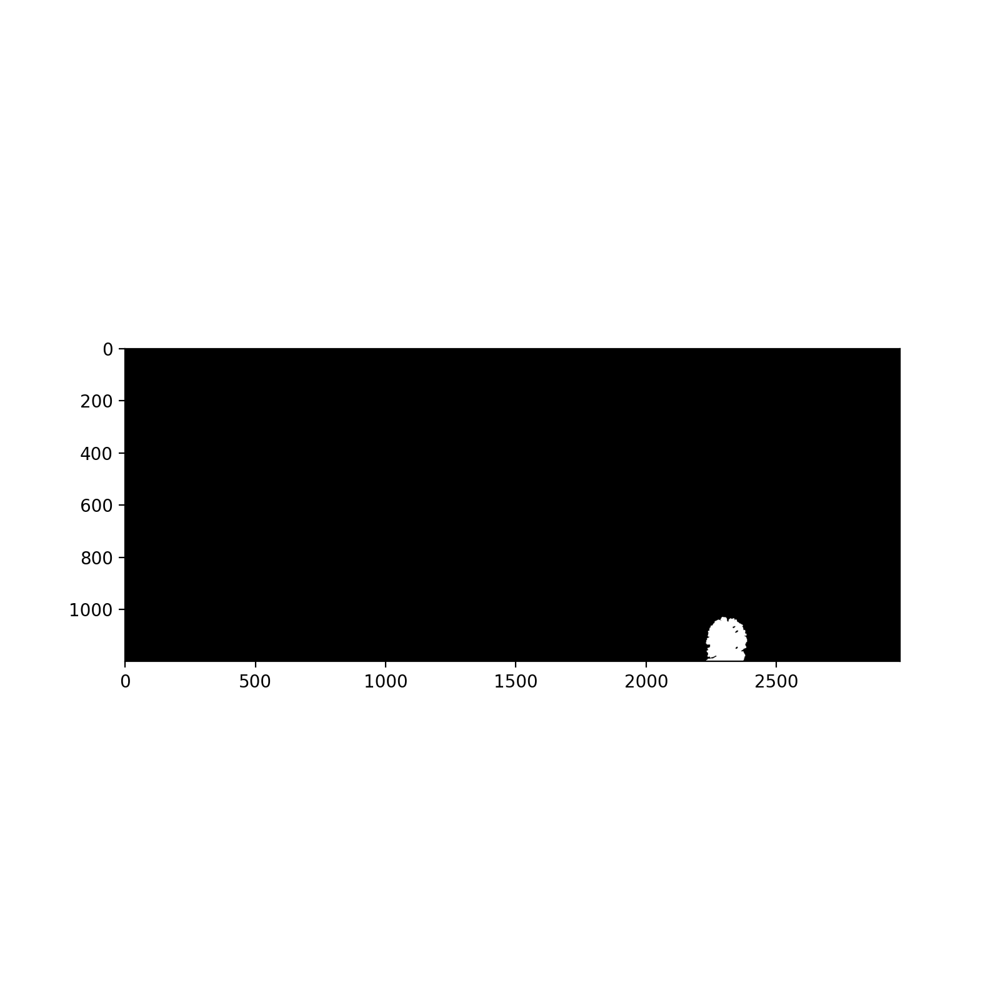

Object 7 Area: 21446 pixels


In [45]:
roi = rois1[7]
hierarchy = roi_hierarchy1[7]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area7 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 7 Area:",filtered_area7, "pixels")

<IPython.core.display.Javascript object>


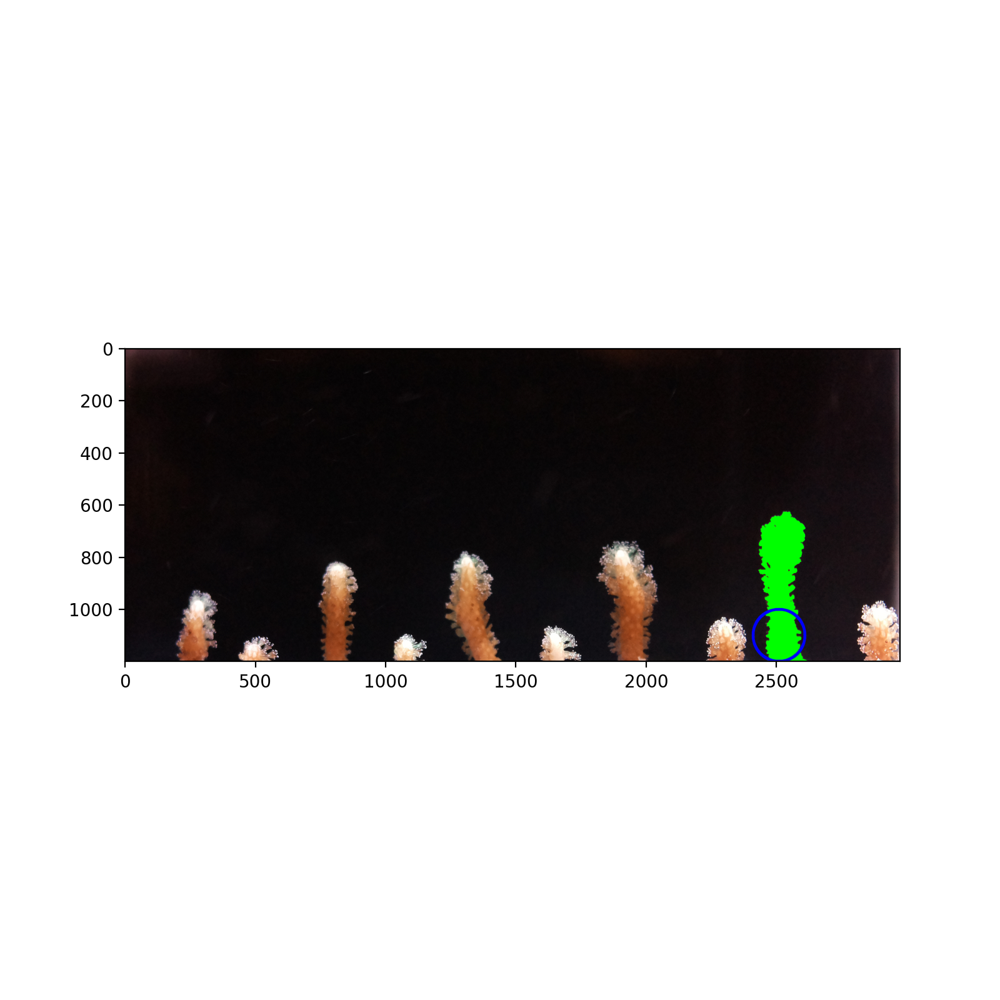

<IPython.core.display.Javascript object>


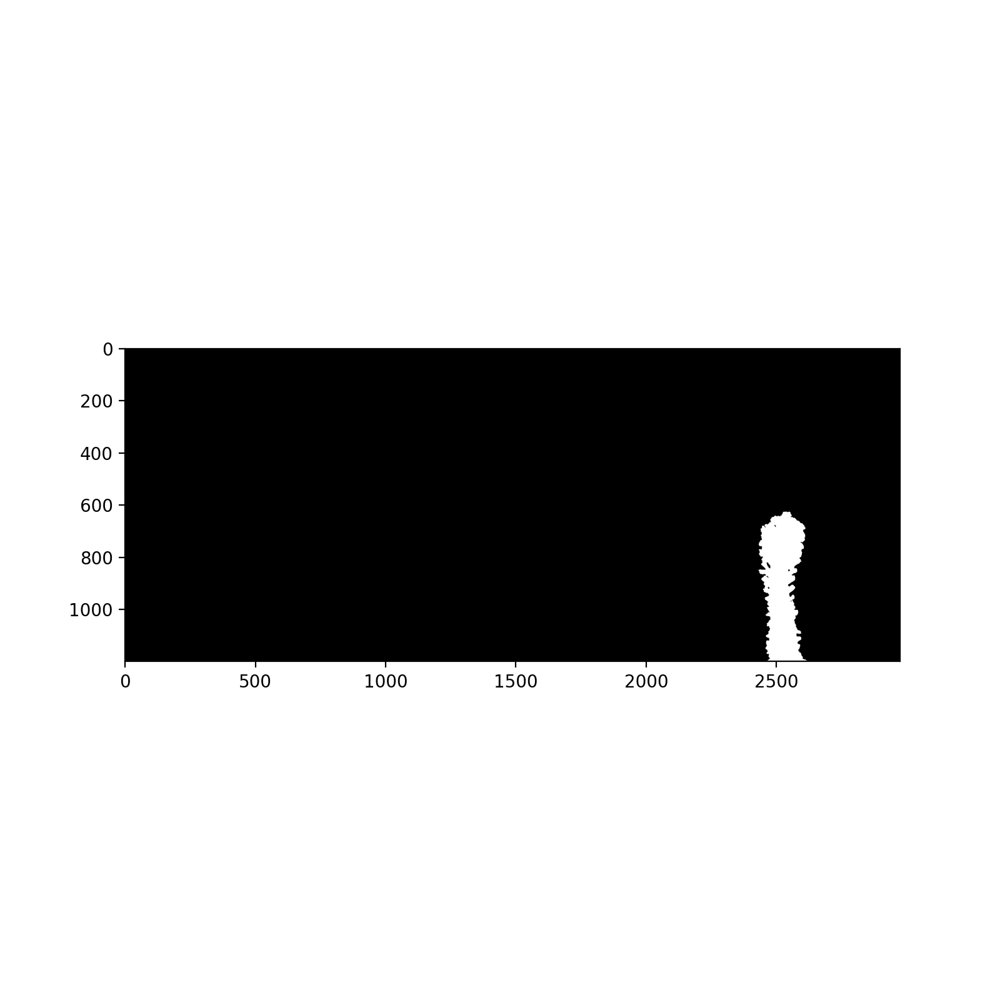

Object 8 Area: 70874 pixels


In [46]:
roi = rois1[8]
hierarchy = roi_hierarchy1[8]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area8 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 8 Area:",filtered_area8, "pixels")

<IPython.core.display.Javascript object>


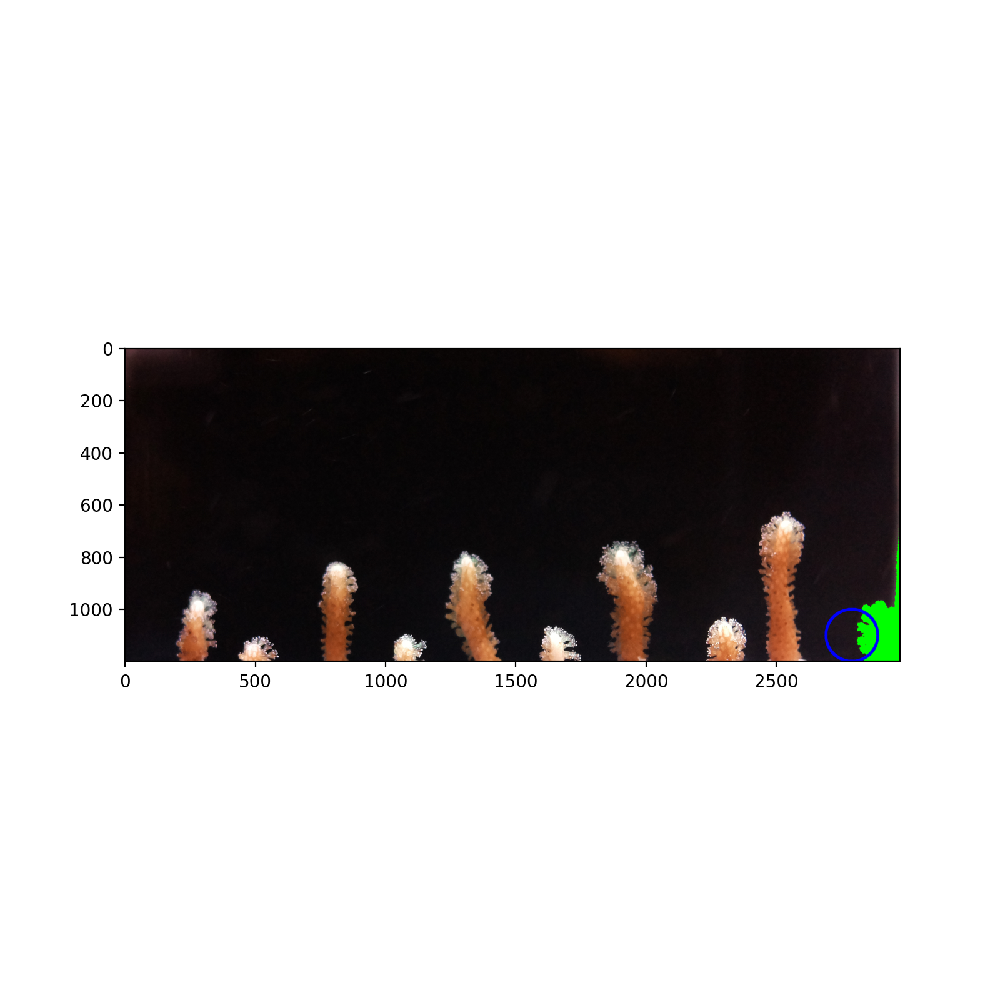

<IPython.core.display.Javascript object>


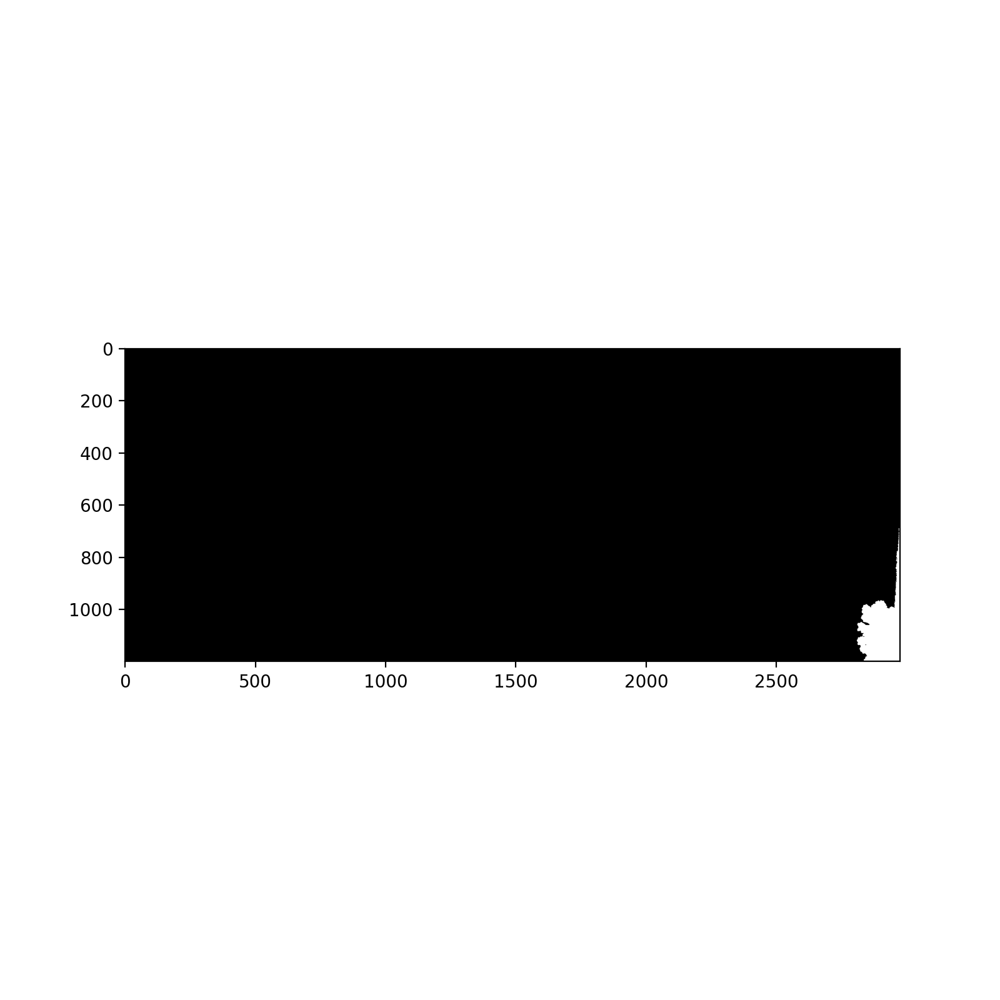

Object 9 Area: 36047 pixels


In [47]:
roi = rois1[9]
hierarchy = roi_hierarchy1[9]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area9 = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

print("Object 9 Area:",filtered_area9, "pixels")

In [48]:
print("Object 0 Area:",filtered_area0, "pixels")
print("Object 1 Area:",filtered_area1, "pixels")
print("Object 2 Area:",filtered_area2, "pixels")
print("Object 3 Area:",filtered_area3, "pixels")
print("Object 4 Area:",filtered_area4, "pixels")
print("Object 5 Area:",filtered_area5, "pixels")
print("Object 6 Area:",filtered_area6, "pixels")
print("Object 7 Area:",filtered_area7, "pixels")
print("Object 8 Area:",filtered_area8, "pixels")
print("Object 9 Area:",filtered_area9, "pixels")

Object 0 Area: 29756 pixels
Object 1 Area: 9962 pixels
Object 2 Area: 38543 pixels
Object 3 Area: 9712 pixels
Object 4 Area: 53335 pixels
Object 5 Area: 14964 pixels
Object 6 Area: 66278 pixels
Object 7 Area: 21446 pixels
Object 8 Area: 70874 pixels
Object 9 Area: 36047 pixels


In [49]:
f = open('/Users/usr12/Desktop/mori/mori/project_roccs/results/plantdata2pm.csv', 'a', newline = '')


#a =something
#w = write 
#r = read
#with open('names.csv', 'a', newline = '') as csvfile:
#    fieldnames = ['zero', 'one', 'two', 'three', 'four', 'five', 'six', 'seven', 'eight', 'nine']
#    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    
#    writer.writeheader()
#    writer.writerow({'zero': zero, 'one': one})    
    
objectzero = filename
pixelzero = filtered_area0

objectone = filename
pixelone = filtered_area1

objecttwo = filename
pixeltwo = filtered_area2

objectthree = filename
pixelthree = filtered_area3

objectfour = filename
pixelfour = filtered_area4

objectfive = filename
pixelfive = filtered_area5

objectsix = filename
pixelsix = filtered_area6

objectseven = filename
pixelseven = filtered_area7

objecteight = filename
pixeleight = filtered_area8

objectnine = filename
pixelnine = filtered_area9

zero = (objectzero, pixelzero)
one = (objectone, pixelone)
two = (objecttwo, pixeltwo)
three = (objectthree, pixelthree)
four = (objectfour, pixelfour)
five = (objectfive, pixelfive)
six = (objectsix, pixelsix)
seven = (objectseven, pixelseven)
eight = (objecteight, pixeleight)
nine = (objectnine, pixelnine)

writer = csv.writer(f)

#zero, ,one, ,two, ,three, ,four, ,five, ,six, ,seven, ,eight, ,nine
writer.writerow(zero + one + two + three + four + five + six + seven + eight + nine)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/usr12/Desktop/mori/mori/project_roccs/results/plantdata2pm.csv'

In [ ]:
coralzero_date = []
coralzero_size = []

coralone_date = []
coralone_size = []

coraltwo_date = []
coraltwo_size = []

coralthree_date = []
coralthree_size = []

coralfour_date = []
coralfour_size = []

coralfive_date = []
coralfive_size = []

coralsix_date = []
coralsix_size = []

coralseven_date = []
coralseven_size = []

coraleight_date = []
coraleight_size = []

coralnine_date = []
coralnine_size = []

%matplotlib inline
file = open('/Users/Usr12/Desktop/mori/mori/project_roccs/results/plantdata2pm.csv', 'r')

for line in file:
    if line [0] =='date' + 'size':
        pass
    else:
        coralzero_date.append(float(line[1]))
        coralzero_size.append(float(line[0]))
        coralone_date.append(float(line[2]))
        coralone_size.append(float(line[0]))
        
plt.plot(coralzero_date, coralzero_size, c='b')
plt.plot(coralone_date, coralone_size, c='b')

#plt.show()



x = [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]
y = [filtered_area0, filtered_area1, filtered_area2, filtered_area3, filtered_area4, filtered_area5, filtered_area6, filtered_area7, filtered_area8, filtered_area9]

tick_label = ['one', 'two', 'three', 'four', 'five', 'six', 'seven', 'eight', 'nine', 'ten']

print(len(tick_label), len(x),len(y))

plt.bar(x, y, tick_label = tick_label,
        width = 100, color = ['red', 'green'])

plt.xlabel('x - axis')
plt.ylabel('y - axis')
plt.title('Plant Data')
plt.show()

plt.savefig('/Users/Usr12/Desktop/mori/mori/project_roccs/results/charts/filename.png')

In [ ]:
#plant_id = range(0,len(rois1))

In [ ]:
#img_copy = np.copy(img)
#pcv.params.debug = "print"
#for i in range(0, len(rois1)):
#    roi = rois1[i]
#    hierarchy = roi_hierarchy1[i]
#    id_label = plant_id[i]
#    filtered_contours, filtered_hierarchy, filtered_mask, filtered_area = pcv.roi_objects(img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, obj_hierarchy=obj_hierarchy)

#    if filtered_area > 0:
#        #combine objects together in each object
#        plant_contour, plant_mask = pcv.object_composition(img=img, contours=filtered_contours, hierarchy=filtered_hierarchy)
#        #analyze the sahpe of each plant
#        img_copy = pcv.analyze_object(img=img_copy, obj=plant_contour, mask=plant_mask, label=id_label)

#pcv.plot_image(img_copy)
#pcv.print_image(img_copy, os.path.join(args.outdir, filename + "_shapes.jpg"))

#cutto is specific, partial is anything overlapping

In [ ]:
#pcv.print_results(filename="results.txt")

In [ ]:
#pcv.outputs.save_results